In [3]:
import json
from typing import List

import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from rich import print
import matplotlib.pyplot as plt

from src.blip_modules.blip_text_encoder import BLIPTextEncoder
from src.blip_modules.blip_img_encoder import BLIPImgEncoder
from src.data_utils import targetpad_transform
from src.cirr_experiment.utils import element_wise_sum_original, get_combing_function_with_alpha, \
    convert_to_pivot_cirr, prepare_and_plot_recall_pivot, prepare_ground_truths, plot_retrieval_results_of_i, \
    found_better_than_original
from src.cirr_experiment.validate_notebook import cirr_val_retrieval_text_image_grid_search, compute_results_cirr_val
from src.utils import device

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Set up the experiment</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Set up the cache for the experiment</div>

In [4]:
cache = {}

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [5]:
BLIP_PRETRAINED_PATH = '../../../models/model_base_retrieval_coco.pth'
MED_CONFIG_PATH = '../../blip_modules/med_config.json'

In [6]:
blip_text_encoder = BLIPTextEncoder(
    BLIP_PRETRAINED_PATH, 
    MED_CONFIG_PATH,
    use_pretrained_proj_layer=True
)

blip_text_encoder = blip_text_encoder.to(device)
print("blip text encoder loaded.")
blip_text_encoder.eval()

load checkpoint from ../../../models/model_base_retrieval_coco.pth for text_encoder.
load checkpoint from ../../../models/model_base_retrieval_coco.pth for text_proj.


blip text encoder loaded.

BLIPTextEncoder(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30524, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Drop

In [7]:
blip_img_encoder = BLIPImgEncoder(BLIP_PRETRAINED_PATH)
blip_img_encoder = blip_img_encoder.to(device)
print("blip img encoder loaded.")
blip_img_encoder.eval()

load checkpoint from ../../../models/model_base_retrieval_coco.pth for visual_encoder.
load checkpoint from ../../../models/model_base_retrieval_coco.pth for vision_proj.


blip img encoder loaded.

BLIPImgEncoder(
  (visual_encoder): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
      

In [8]:
print('Target pad preprocess pipeline is used')
preprocess = targetpad_transform(1.25, 384)

Target pad preprocess pipeline is used

In [9]:
combining_function_original = element_wise_sum_original

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the MLLM generated text captions</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions</div>

In [10]:
with open('../../../cirr_dataset/cirr_labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
print(f'Total number of text captions: {len(text_captions)}')

Total number of text captions: 4609

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the CIRR dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval</div>

In [11]:
grid_search_alphas = np.arange(0, 1.05, 0.05)
total_result: List[pd.DataFrame] = []

for alpha in tqdm(grid_search_alphas, desc="Grid Search alphas and betas"):
    result = cirr_val_retrieval_text_image_grid_search(
        get_combing_function_with_alpha(alpha),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess,
        cache=cache,
    )
    
    total_result.append(result)

recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3 = convert_to_pivot_cirr(total_result)

Grid Search alphas and betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [12]:
display(recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3)

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,7.175317,7.294905,7.342741,7.414494,7.534083,7.605836,7.653672,7.725424,7.916766,8.108108,...,8.562545,8.801722,9.256159,9.758431,10.523798,12.102368,15.307343,22.434825,34.872040,32.480267
0.05,7.294905,7.294905,7.438412,7.558001,7.677589,7.749342,7.940684,8.012437,8.108108,8.347286,...,8.658215,9.112652,9.567089,10.165032,11.049988,12.795982,16.144463,23.869887,35.804832,32.958624
0.10,7.366659,7.414494,7.534083,7.701506,7.868931,7.964602,8.108108,8.203779,8.251614,8.538627,...,9.016982,9.399665,9.997609,10.475963,11.695766,13.585266,17.579526,25.400621,36.641952,33.221719
0.15,7.414494,7.534083,7.677589,7.797178,7.964602,8.203779,8.395121,8.538627,8.682133,8.849557,...,9.303994,9.878019,10.356374,11.169577,12.413298,14.613728,18.942836,26.596507,37.431237,33.173883
0.20,7.534083,7.677589,7.821096,7.940684,7.988519,8.108108,8.299450,8.610380,8.969146,9.232241,...,9.854102,10.428127,11.002152,11.911026,13.298254,15.761779,20.019135,28.414255,37.096387,33.102128
0.25,7.462329,7.629754,7.797178,7.964602,8.060273,8.203779,8.419038,8.753887,9.088735,9.327912,...,10.212868,10.858646,11.504425,12.628558,14.231046,17.029420,21.430279,29.825401,36.713704,32.743362
0.30,7.462329,7.534083,7.773260,7.821096,8.179861,8.203779,8.395121,8.706051,9.064817,9.591007,...,10.571633,11.121741,12.126286,13.465679,15.020330,17.986128,23.343697,30.375507,35.972255,32.312843
0.35,7.294905,7.558001,7.534083,7.940684,8.132026,8.347286,8.538627,9.040900,9.447501,9.949773,...,11.026070,11.934943,12.915571,14.422387,16.431476,19.540779,24.754843,31.164792,35.780913,31.930161
0.40,7.294905,7.438412,7.725424,7.892849,8.060273,8.395121,8.753887,9.280077,9.734514,10.260703,...,11.576178,12.437216,13.752691,15.498684,17.699115,21.525951,26.046401,31.116956,34.776369,30.949533


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,26.405168,26.548672,26.668262,26.835686,27.027026,27.218369,27.577135,27.792394,28.103325,28.318584,...,29.299212,29.992825,31.021288,32.599857,35.278642,39.177230,45.682850,55.871803,67.041379,59.411621
0.05,26.716095,26.955274,27.027026,27.146617,27.505383,27.648887,27.959818,28.390336,28.677350,29.107869,...,29.944989,30.638602,32.001913,33.819661,36.522362,40.923223,47.381011,57.569957,67.639321,60.057402
0.10,26.763931,26.955274,27.098781,27.409711,27.720642,28.031573,28.294668,28.749102,29.060033,29.514471,...,30.495098,31.930161,33.413059,35.254723,37.909591,42.358288,49.557522,59.459460,68.093759,60.487920
0.15,26.787850,27.003109,27.361876,27.624971,27.911982,28.175077,28.557763,28.988281,29.442716,30.112413,...,31.858408,33.078212,34.824204,36.857212,40.229610,44.104281,51.231760,60.822767,68.643868,60.607511
0.20,26.572591,26.716095,27.074862,27.505383,28.007653,28.462091,28.868693,29.203540,30.064577,31.021288,...,33.126047,34.465438,36.259267,38.603204,41.545084,46.232960,52.906001,61.635971,68.285102,60.774934
0.25,26.476920,26.835686,27.290121,27.624971,28.175077,28.629515,29.323128,30.136332,30.877781,31.667066,...,33.963168,35.804832,37.790003,40.229610,43.625927,48.242047,54.939008,62.736189,67.926335,60.368335
0.30,26.261660,26.644343,27.122697,27.935901,28.629515,29.203540,29.944989,30.710357,31.667066,32.695529,...,35.398230,37.144223,39.344653,41.784263,45.467591,49.892369,56.039226,63.118869,66.945708,59.889978
0.35,26.046401,26.644343,27.194452,27.624971,28.533843,29.466635,30.447263,31.499642,32.528102,33.508730,...,36.737624,38.555369,40.707964,43.530256,47.285339,51.662284,57.235110,63.358051,65.701985,58.837599
0.40,26.142073,26.596507,27.074862,27.744558,28.581679,29.442716,30.662522,31.667066,33.317387,34.489357,...,37.790003,39.894763,41.975603,45.132744,48.816073,53.097343,58.024395,63.238460,64.482182,57.689548


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,37.024635,37.215978,37.431237,37.766084,38.053098,38.459697,38.794547,39.201149,39.751256,40.468788,...,42.143029,43.314996,45.084909,47.261420,50.275052,54.675913,61.492467,70.629036,77.923942,69.887584
0.05,37.311649,37.550825,37.861755,38.292274,38.603204,39.129394,39.607748,40.205693,40.851471,41.569003,...,43.530256,44.821814,46.615642,48.959580,52.068883,56.493664,63.358051,72.040182,78.497964,70.748627
0.10,37.479073,37.813920,38.124850,38.603204,39.105478,39.703420,40.301365,41.018894,41.808179,42.645299,...,44.773978,46.376464,48.265964,50.872999,54.006219,58.670175,65.271467,72.757715,78.952402,71.226978
0.15,37.598661,38.053098,38.579288,39.201149,39.679503,40.540540,41.234154,41.903850,42.669219,43.697679,...,46.185124,47.978953,49.796700,52.571154,56.134897,60.751015,66.897869,73.881847,79.095912,71.394402
0.20,37.933508,38.387945,38.770628,39.607748,40.325281,41.258073,42.047358,42.908394,43.745515,44.726142,...,47.500598,49.485770,51.470941,54.364985,57.833052,62.544847,68.141592,75.173402,79.048073,71.083474
0.25,38.053098,38.579288,39.033723,39.727339,40.516624,41.521168,42.477876,43.649843,44.463047,45.587179,...,48.959580,50.896913,53.216934,56.087059,59.746474,64.147335,69.361395,75.460416,79.071993,70.700788
0.30,37.981343,38.507533,39.081559,39.775175,40.660128,41.808179,42.860559,43.984693,45.371920,46.806985,...,50.562066,52.284145,54.819423,57.976562,61.540300,65.893328,70.222437,75.627840,78.306627,70.222437
0.35,37.909591,38.698876,39.368573,40.062186,41.042814,41.951686,43.219325,44.606555,46.209040,47.859365,...,51.638365,53.671372,56.541497,59.579051,63.286293,67.065293,71.274817,75.603920,77.469504,69.600576
0.40,37.646496,38.316193,39.033723,40.014350,40.971059,42.190865,43.506339,45.204496,46.974409,49.127004,...,52.786416,55.202103,58.287489,61.396796,64.649606,67.974168,72.064102,75.508249,76.632386,68.835205


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,65.438890,65.678066,66.108584,66.443437,66.897869,67.352307,67.758912,68.404686,68.954796,69.672328,...,71.896678,73.236066,75.029898,77.230328,79.622102,83.138007,87.419277,91.724467,93.446547,86.797416
0.05,66.132504,66.658694,67.065293,67.352307,67.950249,68.548197,69.074386,69.528818,70.318103,71.418321,...,73.523080,75.125569,76.919395,79.071993,81.224585,84.668738,88.567328,92.418081,93.590051,86.917007
0.10,66.658694,67.208803,67.663240,68.213344,68.930876,69.385314,70.031095,70.724708,71.537912,72.614205,...,75.388664,76.991153,78.569722,80.554891,83.066255,85.984212,89.380533,92.824686,93.709642,87.180102
0.15,67.137051,67.878497,68.213344,69.146138,69.768000,70.246351,71.226978,72.064102,72.972971,73.881847,...,77.182490,78.545803,80.243963,82.229131,84.333891,87.036592,90.241569,93.039942,93.829226,87.227935
0.20,67.519730,68.141592,68.906963,69.696248,70.437694,71.226978,72.207606,73.283905,74.336284,75.747430,...,78.354460,79.909110,81.798613,83.401102,85.458022,88.184643,90.959102,93.207365,93.900979,87.371445
0.25,67.567569,68.428606,69.576657,70.437694,71.155226,72.111934,73.188233,74.551541,75.795263,77.015066,...,79.765606,81.368095,82.946664,84.716576,86.773497,89.308780,91.437453,93.231285,93.781394,87.514949
0.30,67.854577,68.930876,69.959342,70.916051,71.777087,72.901219,74.312365,75.819182,76.967233,78.258789,...,81.152833,82.779241,84.190387,85.960299,87.778044,90.026307,91.628796,93.326956,93.566132,87.347525
0.35,67.902416,68.930876,69.959342,71.203059,72.351110,73.690504,75.340825,76.536715,77.804351,79.430759,...,82.300884,83.831620,85.362351,87.060511,88.399905,90.456831,91.867971,93.326956,93.183452,87.156183
0.40,67.400146,68.691701,70.150679,71.322650,72.566372,73.881847,75.914854,77.158576,78.832817,80.554891,...,83.425015,84.668738,86.342978,87.849796,89.165270,90.791678,92.226738,93.255204,92.872518,86.940920


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,21.215020,21.310692,21.382445,21.645540,21.884717,22.171730,22.458743,22.721837,22.961015,23.343697,...,24.491748,25.328869,26.453000,27.744558,30.232003,33.747908,39.105478,49.318346,64.051664,73.092562
0.05,21.382445,21.549869,21.669456,21.860799,22.123894,22.410907,22.721837,23.128438,23.558958,23.893805,...,25.137526,26.070318,27.266204,28.916526,31.356135,35.039464,40.994978,50.801241,65.127957,73.570913
0.10,21.525951,21.741210,21.980387,22.243482,22.506577,22.841425,23.248027,23.654628,24.132982,24.707007,...,25.998566,27.003109,28.366420,30.112413,32.528102,36.402774,42.573547,52.427649,66.132504,73.594832
0.15,21.597704,21.836881,22.147812,22.339153,22.769672,23.295863,23.678546,24.372160,24.970102,25.568047,...,26.979190,28.198996,29.634058,31.499642,34.274098,37.813920,44.271705,54.077971,67.352307,73.834014
0.20,21.693374,22.076058,22.530495,22.817507,23.224109,23.654628,24.013394,24.707007,25.352785,26.022482,...,27.768478,29.203540,30.973452,32.815117,35.924420,39.512077,45.922029,55.991387,67.687154,73.834014
0.25,21.765128,22.291318,22.554412,22.961015,23.415451,23.869887,24.396077,25.041857,25.878978,26.811767,...,28.988281,30.351591,32.336763,34.728533,37.766084,41.688591,47.620186,57.450372,68.022007,73.475248
0.30,21.382445,21.980387,22.530495,22.793590,23.487204,24.132982,24.850515,25.735471,26.835686,27.864146,...,30.040661,31.667066,33.700073,36.426693,39.129394,43.171489,49.653193,58.837599,68.045920,73.283905
0.35,21.430279,21.980387,22.339153,23.008850,23.606792,24.348243,25.233197,26.405168,27.481464,28.725186,...,31.260464,32.862952,35.087299,37.837839,41.090649,44.965318,51.662284,59.842145,68.261182,72.757715
0.40,21.525951,21.932553,22.434825,23.056684,23.845969,24.802679,25.902894,27.170533,28.175077,29.394883,...,32.336763,34.106672,36.737624,39.535996,42.788807,46.902654,53.432190,60.511839,68.476439,71.729249


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,41.592920,41.879934,42.119110,42.334369,42.764890,43.267161,43.841186,44.367376,44.869649,45.754606,...,47.500598,48.744321,50.418562,52.451569,55.369526,59.842145,65.797657,73.666584,82.611817,87.132263
0.05,41.784263,41.975603,42.358288,42.573547,43.147573,43.745515,44.534799,45.156661,45.945945,46.615642,...,48.672566,50.227219,51.853621,53.958380,57.163358,61.516386,67.160964,74.695051,83.209759,87.227935
0.10,42.023438,42.453960,42.764890,43.291080,43.984693,44.630471,45.348004,46.065533,46.806985,47.763693,...,49.892369,51.447022,53.312606,55.632621,59.028941,63.118869,68.906963,75.867015,83.544606,87.754124
0.15,42.047358,42.669219,43.267161,43.649843,44.415212,45.180580,45.993781,46.711314,47.668022,48.768237,...,51.207846,52.786416,54.986846,57.163358,60.583591,64.482182,70.246351,76.895481,83.903372,87.921548
0.20,42.047358,42.836642,43.649843,44.223869,44.989237,45.587179,46.711314,47.572351,48.552978,49.485770,...,52.236307,54.125810,56.421906,58.909351,62.186080,66.276008,71.155226,77.541256,84.453481,87.897635
0.25,42.047358,42.836642,43.625927,44.582635,45.348004,46.185124,47.213584,48.600814,49.557522,50.944752,...,53.790957,55.632621,58.096147,60.727102,64.003825,67.639321,72.757715,78.450131,84.596986,88.160729
0.30,42.071274,42.812723,43.817270,44.750059,45.682850,46.496055,47.787610,49.174839,50.681657,51.877540,...,55.202103,57.402533,59.985650,62.760103,65.414971,68.811291,73.618752,78.928488,84.644824,87.897635
0.35,42.047358,42.812723,43.769434,44.917485,45.993781,47.428843,48.720402,50.251138,51.614445,53.288686,...,56.780672,59.148526,61.540300,63.979912,66.897869,70.150679,74.575460,79.669935,84.501314,87.706292
0.40,42.190865,43.004066,43.936858,45.108825,46.543890,47.907200,49.557522,51.207846,52.499402,54.532409,...,58.431000,60.464007,62.903613,65.654153,68.213344,71.705335,75.699592,79.909110,84.309971,87.682372


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,61.683810,61.899066,62.138242,62.544847,62.879694,63.334131,63.884240,64.601767,65.223628,65.701985,...,67.639321,68.667781,70.174599,72.135854,74.623299,77.541256,81.583351,86.773497,91.891891,93.685722
0.05,61.946905,62.162161,62.497008,62.927532,63.429803,63.955992,64.601767,65.175796,65.701985,66.586941,...,68.691701,70.078927,71.657497,73.666584,75.747430,79.048073,82.540065,87.538868,92.035401,93.924898
0.10,62.066489,62.473094,62.903613,63.358051,63.788569,64.434344,65.223628,65.845490,66.491270,67.687154,...,69.648409,71.155226,72.829467,74.862474,77.254248,80.148292,83.544606,88.447738,92.202824,94.020569
0.15,62.114328,62.544847,63.190627,63.740730,64.314759,64.960533,65.845490,66.586941,67.352307,68.356854,...,70.820379,72.662044,74.216694,75.771344,78.282708,81.200671,84.668738,88.734752,92.442000,93.996650
0.20,61.946905,62.568766,63.262379,63.788569,64.840949,65.582395,66.491270,67.208803,68.332934,69.600576,...,72.327197,73.523080,75.197321,76.847643,79.406840,82.013875,85.434109,89.189190,92.465919,94.116241
0.25,62.018657,62.736189,63.477635,64.290839,65.319300,66.276008,67.304474,68.261182,69.361395,70.557284,...,73.331738,74.527627,76.249701,78.402299,80.674481,83.305430,86.151636,89.691460,92.633343,94.307584
0.30,62.090409,63.023198,63.764650,64.673525,65.749818,66.969627,67.830664,69.050467,70.509446,71.633583,...,74.503708,75.938773,77.589095,79.669935,81.870365,84.142548,86.701745,89.930636,92.681175,94.211912
0.35,62.186080,63.094956,63.884240,64.936620,65.941161,67.352307,68.715620,70.007175,71.179146,72.422868,...,75.890934,77.445585,79.239416,80.913657,82.994497,85.242766,87.538868,90.169817,92.752928,93.900979
0.40,61.803395,62.831861,63.836402,64.936620,66.252095,67.734993,69.409233,70.939964,72.064102,73.594832,...,77.038985,78.737146,80.243963,82.300884,84.094715,86.079884,88.375986,90.385073,92.609423,93.948817


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [13]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall results</div>

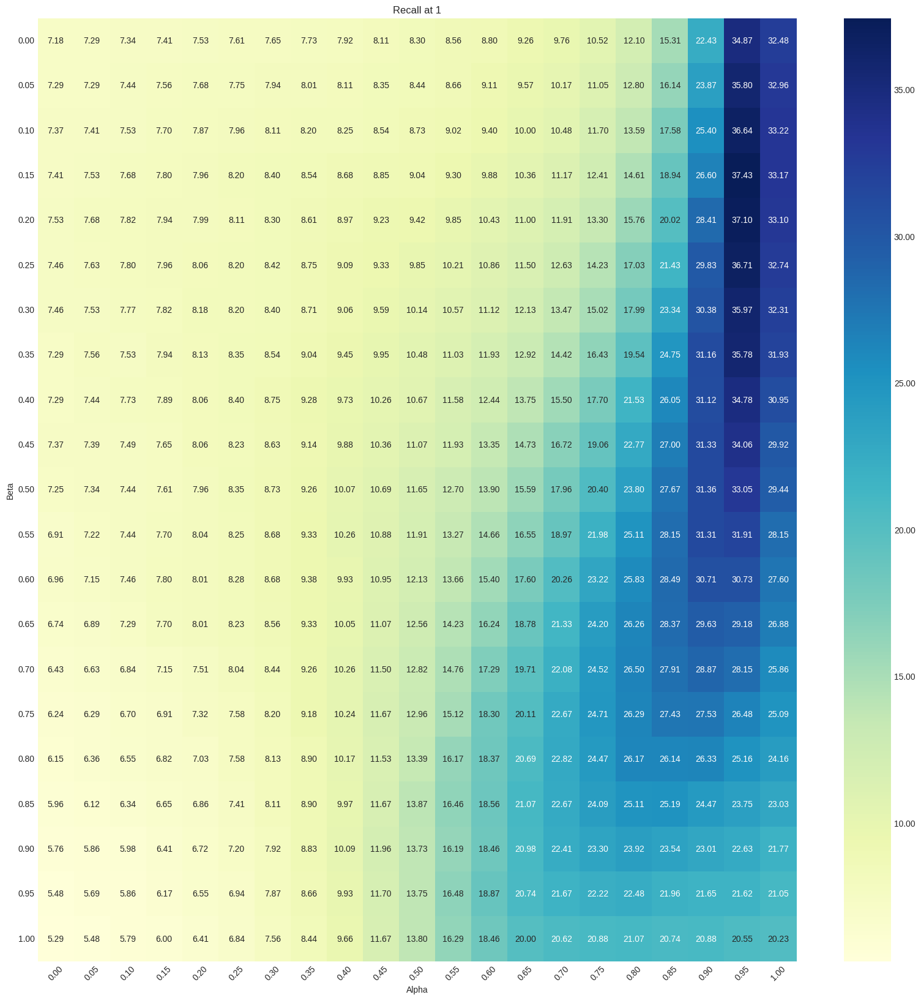

In [14]:
prepare_and_plot_recall_pivot(recall_at1, 'Recall at 1')

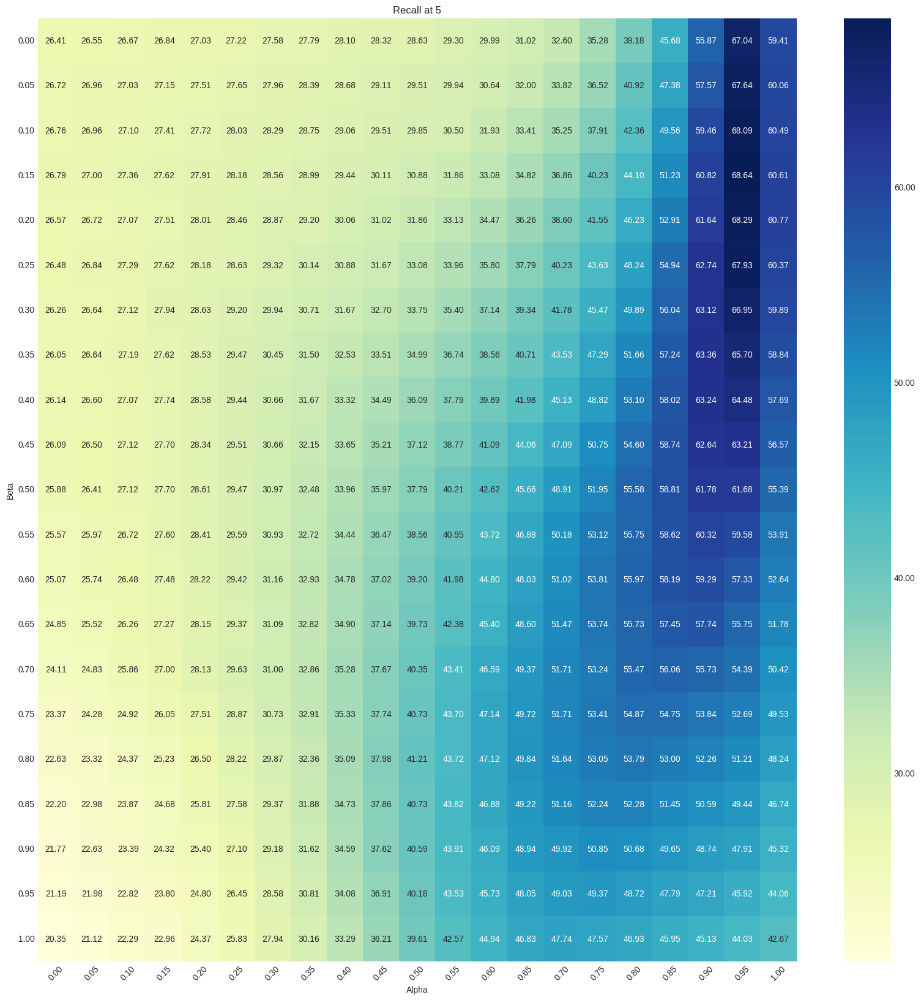

In [15]:
prepare_and_plot_recall_pivot(recall_at5, 'Recall at 5')

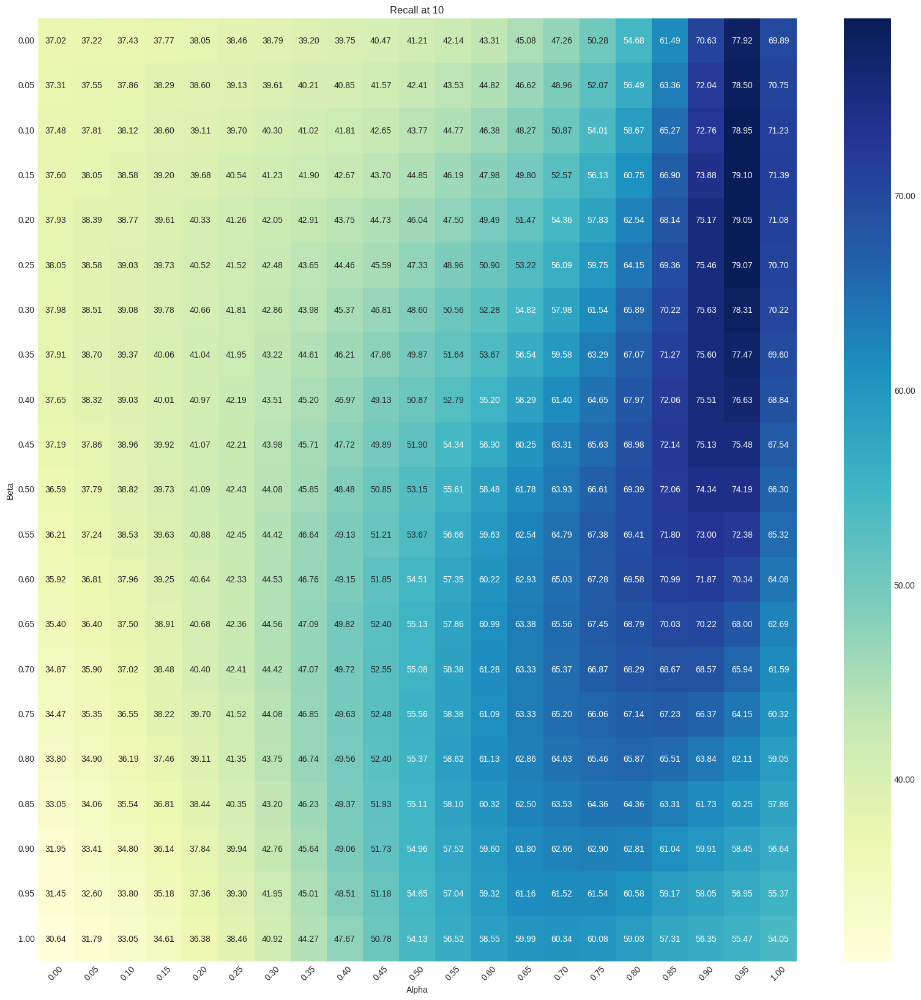

In [16]:
prepare_and_plot_recall_pivot(recall_at10, 'Recall at 10')

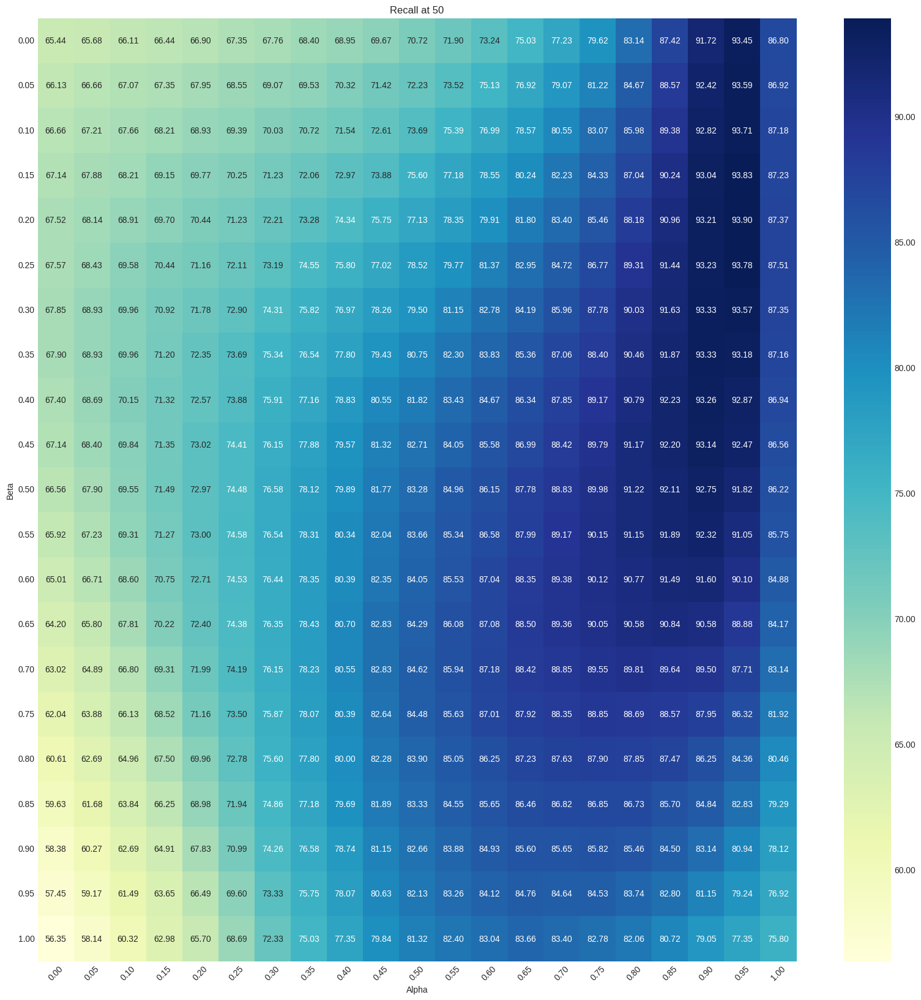

In [17]:
prepare_and_plot_recall_pivot(recall_at50, 'Recall at 50')

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the group recall results</div>

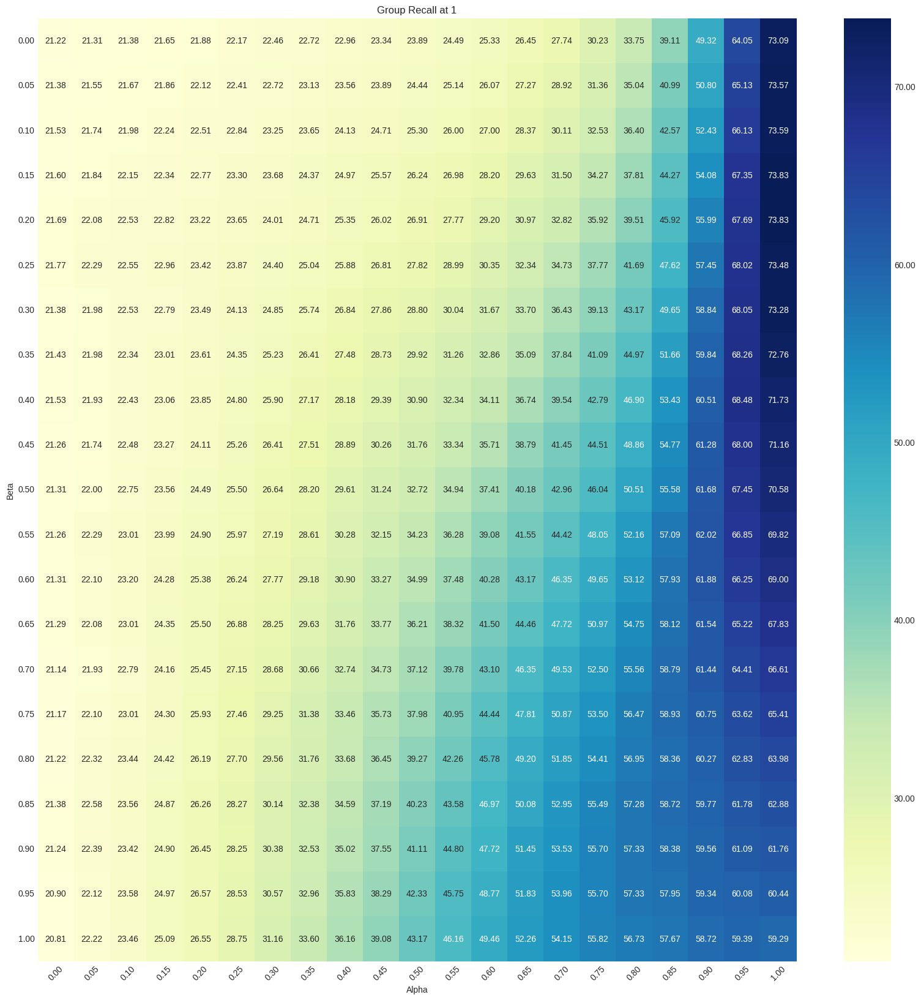

In [18]:
prepare_and_plot_recall_pivot(group_recall_at1, 'Group Recall at 1')

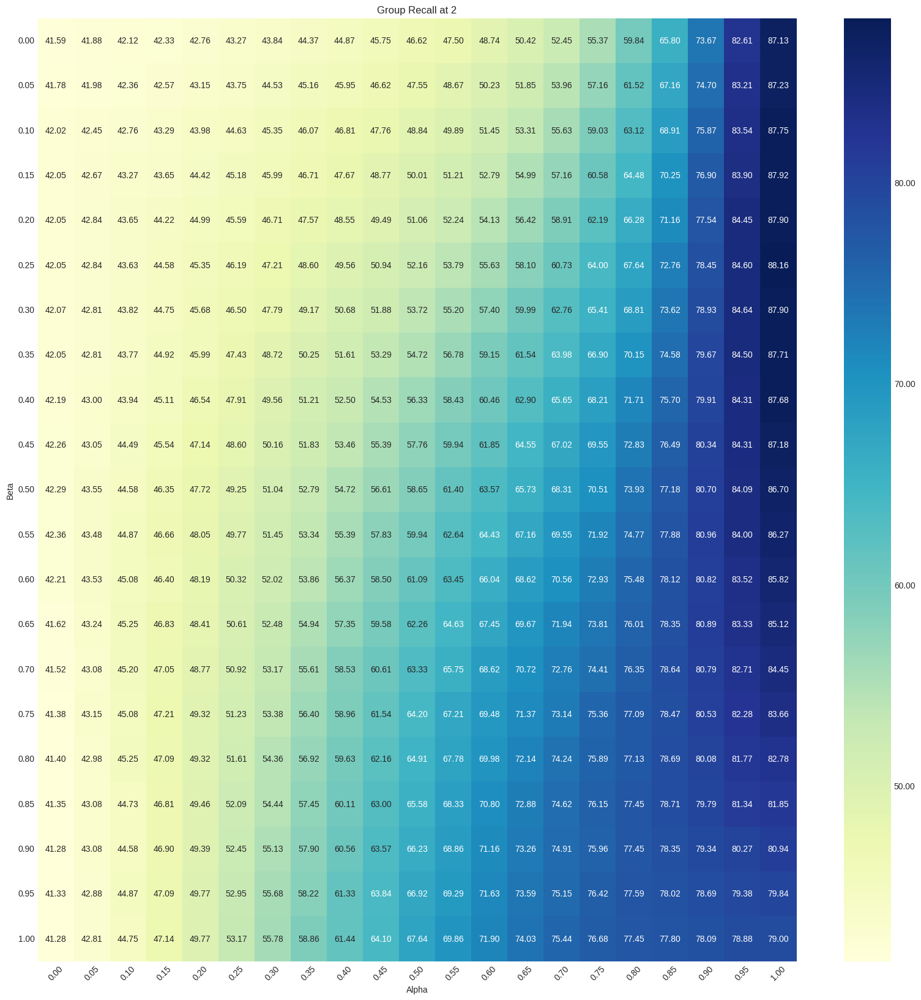

In [19]:
prepare_and_plot_recall_pivot(group_recall_at2, 'Group Recall at 2')

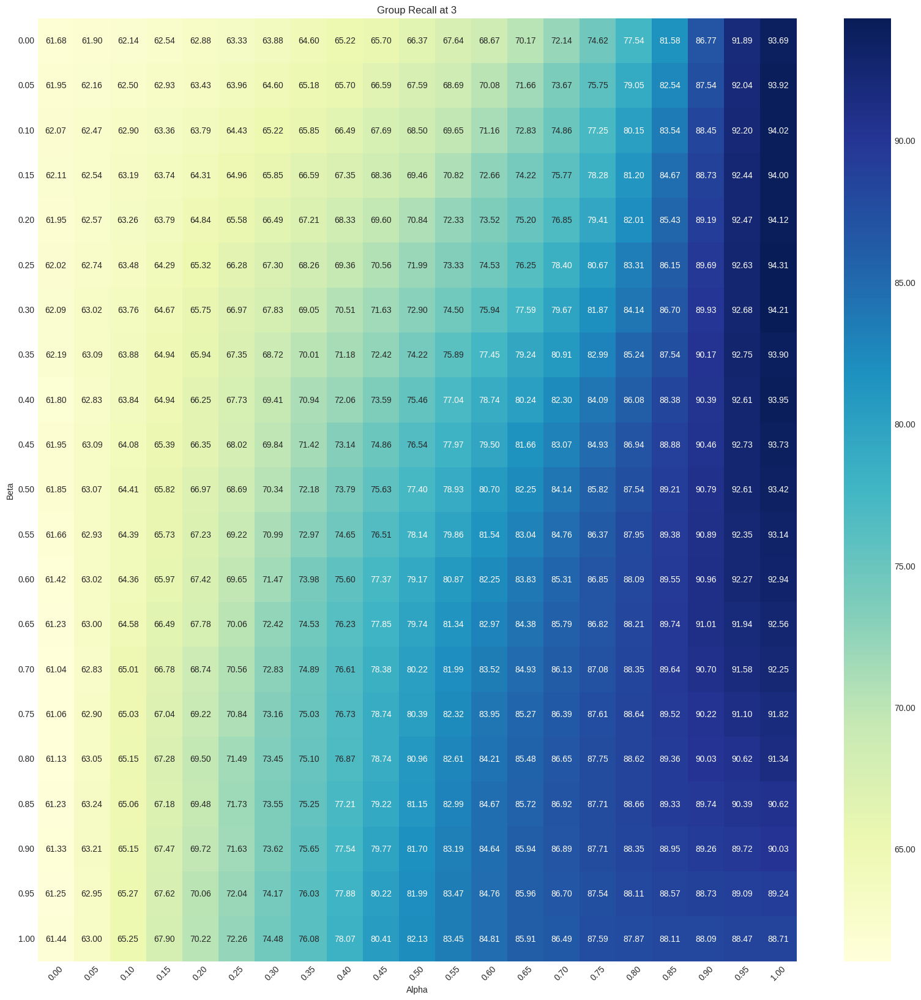

In [20]:
prepare_and_plot_recall_pivot(group_recall_at3, 'Group Recall at 3')

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results</div>

In [21]:
sorted_indices, image_index_names, target_names = compute_results_cirr_val(
    get_combing_function_with_alpha(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0.2,
    cache=cache,
)

Recall Results
Recall at 1: 37.10
Recall at 5: 68.29
Recall at 10: 79.05
Recall at 50: 93.90
Group Recall Results
Group Recall at 1: 67.69
Group Recall at 2: 84.45
Group Recall at 3: 92.47


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [22]:
ground_truth = prepare_ground_truths(json.load(open('../../../cirr_dataset/cirr/captions/cap.rc2.val.json')))

DATASET_IMAGE_DIR = '../../../cirr_dataset/dev/'

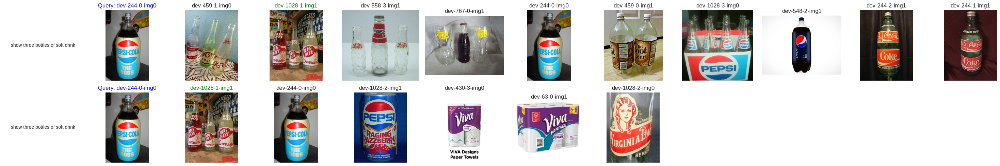

In [23]:
plot_retrieval_results_of_i(
    sorted_indices, 
    image_index_names, 
    target_names, 
    ground_truth, 
    top_k=10, 
    i=0,
    directory=DATASET_IMAGE_DIR,
)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with the original without MMLM captions and identical weights element-wise sum</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [24]:
sorted_indices_origin, image_index_names_origin, target_names_origin = compute_results_cirr_val(
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0,
    cache=cache,
)

Recall Results
Recall at 1: 8.30
Recall at 5: 28.63
Recall at 10: 41.21
Recall at 50: 70.72
Group Recall Results
Group Recall at 1: 23.89
Group Recall at 2: 46.62
Group Recall at 3: 66.37


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [25]:
become_better = found_better_than_original(
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    sorted_indices, image_index_names, target_names,
    top_k=10
)

len(become_better), become_better[:10]

(1721, [6, 14, 15, 18, 23, 25, 30, 32, 34, 50])

In [26]:
become_worse = found_better_than_original(
    sorted_indices, image_index_names, target_names,
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(137, [4, 22, 24, 46, 56, 183, 195, 252, 288, 304])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

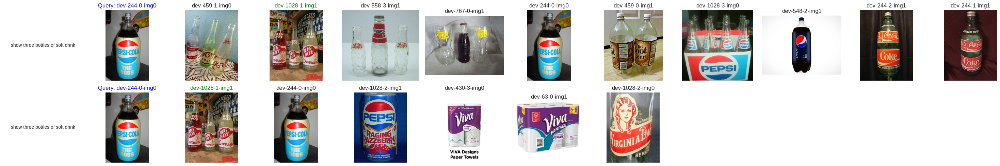

In [27]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=0)

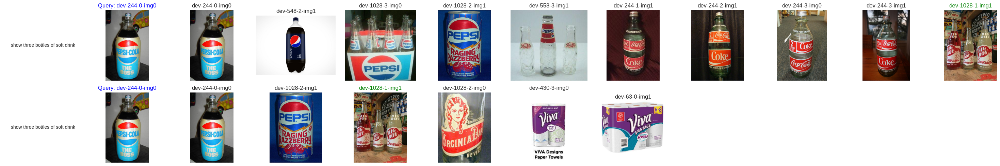

In [28]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=0)

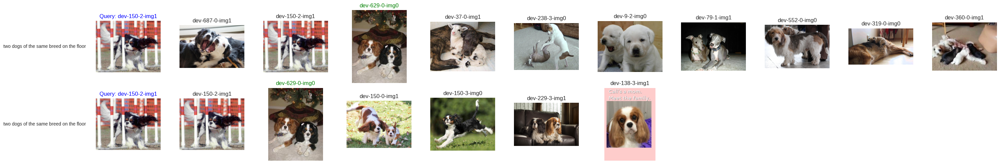

In [29]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=6)

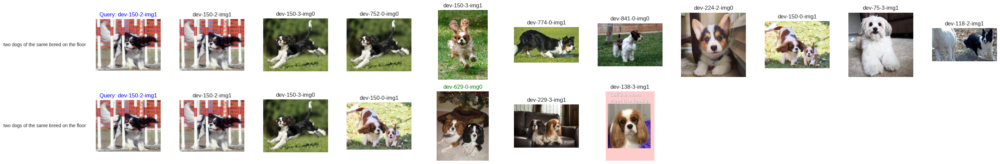

In [30]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=6)

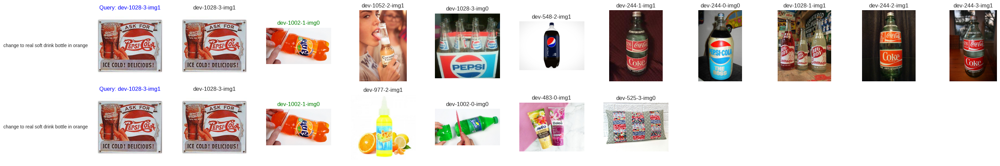

In [31]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=19)

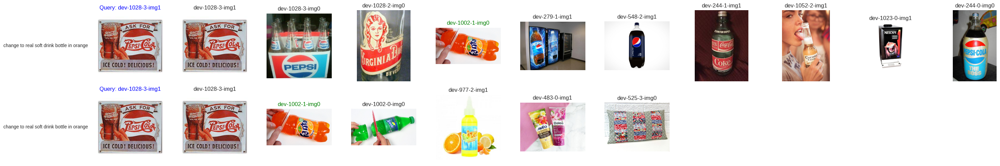

In [32]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=19)